In [22]:
import pandas as pd
import numpy as np
import random as rd
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.datasets import mnist

In [23]:
dfData = pd.read_table("train.csv", sep = ',')

In [24]:
dfData = dfData.append(dfData)

In [27]:
mxSampleIndex = np.zeros((84000, 24))
for index, row in dfData.iterrows():
    listSamp = rd.sample(range(1,785), 24)
    mxSampleIndex[index,:] = listSamp
    
    for i in listSamp:
        row[i] = 255 - row[i]
        
        
#rd.sample(range(0,784),24)


In [90]:
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

(x_train, _), (x_test, _) = mnist.load_data()

In [91]:
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))
print(x_train.shape)
print(x_test.shape)

(60000, 784)
(10000, 784)


In [40]:
# Doubling the training set
npTrain = np.concatenate((x_train, x_train), axis = 0)

for i in range(0,400):
    print(np.sum(npTrain[i]))



107.941
121.941
76.2471
67.1961
91.0353
116.082
69.2
140.655
42.6431
85.898
111.953
55.8824
140.239
111.541
45.5765
99.2
96.6078
106.298
53.2902
69.5608
133.965
138.953
61.3765
65.0078
86.149
159.926
53.251
180.831
163.404
61.7451
100.008
127.706
68.9451
83.0353
143.165
64.0235
124.969
146.141
86.0431
105.412
53.7059
111.0
49.549
70.6039
67.4275
94.7373
90.9098
88.0431
67.3961
129.263
73.5333
178.6
109.592
65.898
92.5098
126.929
164.282
78.6784
133.149
66.0314
115.514
71.1294
118.871
181.353
103.02
65.0627
105.8
59.6627
96.9098
165.776
86.6196
80.0235
42.1725
102.396
102.537
133.471
103.071
66.5216
77.3765
91.4824
102.659
144.91
157.58
105.067
72.9569
102.173
85.6157
109.506
132.839
98.7294
116.761
101.71
60.298
114.996
106.953
147.933
71.1882
114.8
84.3569
50.3647
70.749
91.9373
44.4039
75.2941
45.5882
75.6824
104.631
122.58
113.325
82.7843
97.3451
179.776
45.8078
80.8353
158.851
82.8745
100.353
157.204
98.3255
168.788
156.098
180.408
94.5922
95.6824
36.6784
104.059
109.067
91.3765
78

In [93]:
#taking a 10% sample of the training set - for computational tractability

#rd.seed(12346)
listTrainSamp = rd.sample(range(0,120000), 12000)

autoencoder.fit(npTrain[listTrainSamp,], npTrain[listTrainSamp,],
                epochs=50,
                batch_size=256,
                shuffle=True,
                validation_data=(x_test, x_test))





Train on 12000 samples, validate on 10000 samples
Epoch 1/50
12000/12000 [==============================] - 1s - loss: 0.6556 - val_loss: 0.5366
Epoch 2/50
12000/12000 [==============================] - 0s - loss: 0.4493 - val_loss: 0.3354
Epoch 3/50
12000/12000 [==============================] - 0s - loss: 0.4062 - val_loss: 0.3204
Epoch 4/50
12000/12000 [==============================] - 0s - loss: 0.4037 - val_loss: 0.3173
Epoch 5/50
12000/12000 [==============================] - 0s - loss: 0.4022 - val_loss: 0.3159
Epoch 6/50
12000/12000 [==============================] - 0s - loss: 0.4008 - val_loss: 0.3137
Epoch 7/50
12000/12000 [==============================] - 0s - loss: 0.3994 - val_loss: 0.3119
Epoch 8/50
12000/12000 [==============================] - 0s - loss: 0.3978 - val_loss: 0.3100
Epoch 9/50
12000/12000 [==============================] - 0s - loss: 0.3962 - val_loss: 0.3080
Epoch 10/50
12000/12000 [==============================] - 0s - loss: 0.3944 - val_loss: 0.3059

In [99]:
from keras import regularizers

encoding_dim = 32

input_img = Input(shape=(784,))
# add a Dense layer with a L1 activity regularizer
encoded = Dense(encoding_dim, activation='relu',
                activity_regularizer=regularizers.l1(10e-5))(input_img)
decoded = Dense(784, activation='sigmoid')(encoded)

autoencoder = Model(input_img, decoded)

In [8]:
# Convolutional encoders



from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K

input_img = Input(shape=(28, 28, 1))  # adapt this if using `channels_first` image data format

x = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(16, (3, 3), activation='relu')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')

In [9]:
(x_train, _), (x_test, _) = mnist.load_data()

#Taking a 10% random sample for computational tractability

listTrainSamp = rd.sample(range(0,60000), 6000)
x_train = x_train[listTrainSamp,]

listTestSamp = rd.sample(range(0,10000), 6000)
x_test = x_test[listTestSamp,]





x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))#adapt this if using `channels_first` image data format
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  #adapt this if using `channels_first` image data format

In [14]:
from keras.callbacks import TensorBoard

autoencoder.fit(x_train, x_train,
                epochs=20,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test, x_test),
                callbacks=[TensorBoard(log_dir='/tmp/autoencoder')])

Train on 6000 samples, validate on 6000 samples
Epoch 1/20
6000/6000 [==============================] - 20s - loss: 0.2311 - val_loss: 0.2232
Epoch 2/20
6000/6000 [==============================] - 20s - loss: 0.2194 - val_loss: 0.2131
Epoch 3/20
6000/6000 [==============================] - 20s - loss: 0.2111 - val_loss: 0.2140
Epoch 4/20
6000/6000 [==============================] - 20s - loss: 0.2039 - val_loss: 0.2003
Epoch 5/20
6000/6000 [==============================] - 21s - loss: 0.1974 - val_loss: 0.1925
Epoch 6/20
6000/6000 [==============================] - 20s - loss: 0.1912 - val_loss: 0.1843
Epoch 7/20
6000/6000 [==============================] - 19s - loss: 0.1870 - val_loss: 0.1831
Epoch 8/20
6000/6000 [==============================] - 19s - loss: 0.1815 - val_loss: 0.1769
Epoch 9/20
6000/6000 [==============================] - 20s - loss: 0.1791 - val_loss: 0.1755
Epoch 10/20
6000/6000 [==============================] - 19s - loss: 0.1766 - val_loss: 0.1698
Epoch 11/20

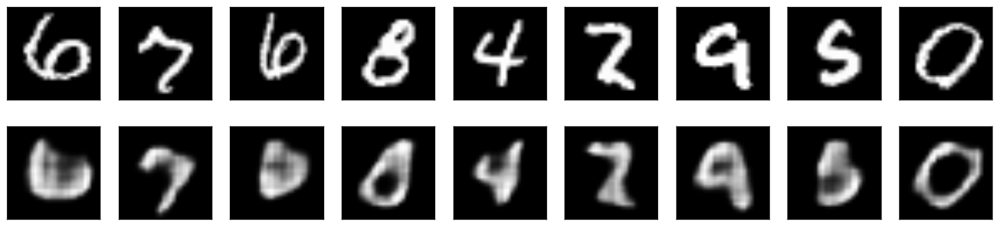

In [15]:
decoded_imgs = autoencoder.predict(x_test)

n = 10
plt.figure(figsize=(20, 4))
for i in range(1,n):
    # display original
    ax = plt.subplot(2, n, i)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, n, i + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [75]:
(x_train, _), (x_test, _) = mnist.load_data()
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))
print(x_train.shape)
print(x_test.shape)

(60000, 784)
(10000, 784)


In [76]:
#Denoising application

#Doubling the training set
npTrain = npTrainCln = np.concatenate((x_train, x_train), axis = 0)
#npTrainCln = np.concatenate((x_train, x_train), axis = 0)
                     
mxSampleIndex = np.zeros((120000, 24))

# Randomly flipping 3% (24) pixels in each image
for i in range(0,120000):
    for j in range(0,784):
        npTrain[i,j] = npTrain[i,j]
        npTrainCln[i,j] = npTrain[i,j]           
    listSamp = rd.sample(range(0,784), 24)
    mxSampleIndex[i,:] = listSamp
    for j in listSamp:
        npTrain[i,j] = 1 - npTrain[i,j]
    


In [77]:
#Viewing the noisy training set
list(npTrain[:1200,:])



[array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         1.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0. 

In [136]:
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))  # adapt this if using `channels_first` image data format
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  # adapt this if using `channels_first` image data format


# Doubling the training data set
#x_train_noisy = x_train = np.append(x_train, x_train)

# creating an array 120000 * 24, where 24 = 3% sample of 784 = 120,000 random samples
sampleIndex = np.zeros((120000, 24))

for i in range(0,120000):
    listSamp = rd.sample(range(0,784), 24)
    sampleIndex[i,:] = listSamp
    for j in listSamp:
        x_train_noisy[i,j] = 1 - x_train_noisy[i,j]
        




IndexError: too many indices for array

In [ ]:
from keras.datasets import mnist
import numpy as np

(x_train, _), (x_test, _) = mnist.load_data()

x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))  # adapt this if using `channels_first` image data format
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  # adapt this if using `channels_first` image data format

noise_factor = 0.5
x_train_noisy = x_train + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_train.shape) 
x_test_noisy = x_test + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_test.shape) 

x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

In [ ]:
n = 10
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i)
    plt.imshow(x_test_noisy[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()